# Computer Vision, Assignment 2: Calibration and DLT

In this assignment you will study camera calibration, the projective ambiguity, and the DLT method. 

You will solve the resection and triangulation problems using DLT and compute inner parameters using RQ factorization.
In addition you will try out SIFT for feature detection/matching.

Please see Canvas for detailed instructions on what is expected for a passing/higher grade. All computer exercises not marked **OPTIONAL** are "mandatory" in the sense described on Canvas.

### Submission Requirements:
Your final lab submission should include:
1. Your edited **notebook file** (`.ipynb`).
2. An **HTML printout** of the executed notebook with all outputs visible: File → Save and export Notebook As → HTML
3. A **pdf report** containing answers to the theoretical exercises (see separate document).


In [1]:
# for creating responsive plots
%matplotlib widget  

import cv2
import matplotlib.image as mpimg
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import numpy as np
import scipy
import scipy.io

from supplied import pflat, plot_camera

# Calibrated vs. Uncalibrated Reconstruction

#### *Theoretical exercise 1* (see pdf)

## Computer Exercise 1
Figure 1 shows an image of a scene and a reconstruction using uncalibrated cameras. The file `compEx1data.mat` contains 
the 3D points of the reconstruction `X`, the camera matrices `P`, the image points `x` and the filenames `imfiles` of the images.
Here `X` is a $4 \times 9471$ matrix containing the homogeneous coordinates for all 3D points, `x{i}` is a $3 \times 9471$ matrix containing the homogeneous coordinates of the image points seen in image $i$ (`NaN` means that the point has not been detected in this image). `P{i}` contains the camera matrix of image $i$ and `imfiles{i}` contains the name of that image.

<figure align="center">
    <img alt="left" src="figs/DSC_0025.JPG" width="250px">
&nbsp; &nbsp; &nbsp; &nbsp;
    <img alt="right" src="figs/projective_rec.png" width="150px">
    <figcaption>Figure 1: Left: An image of the scene. Right: A projective (uncalibrated) reconstruction.</figcaption>
</figure>

### Task 1.1
Plot the 3D points of the reconstruction. Use the supplied function `plot_camera` to plot the cameras in the same figure.

**Do the physical properties (such as the relative heights of each of the two walls, the angle in the corner, and the relation between the width, height, and depth dimensions) look realistic in the reconstruction?**

Don't forget to use `ax.set_aspect('equal')` when plotting -- otherwise you may get additional distortion. The reconstruction should look like the one shown in Figure 1.

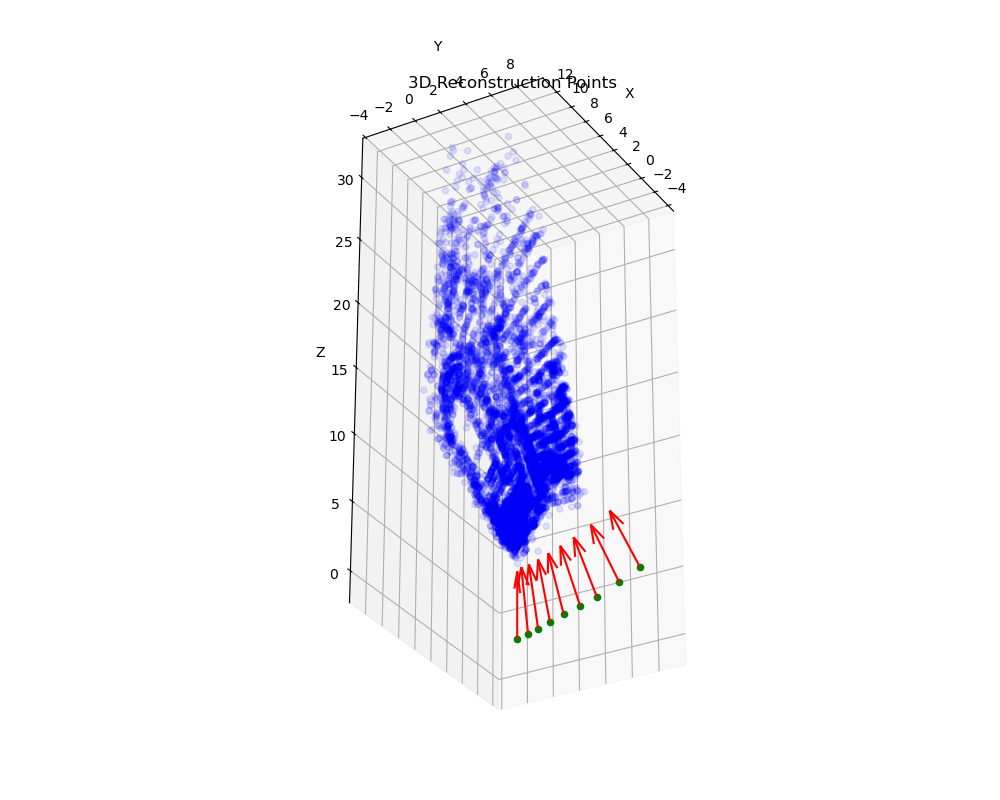

In [2]:

# ------ Your code here ------ 
data = scipy.io.loadmat('data/compEx1data.mat') 
X=data['X']
P=data['P'][0]
#print(P)
X_point = pflat(X)
X_3d = X_point[:3, :]
plt.close('all')
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(X_3d[0, :], X_3d[1, :], X_3d[2, :], c='b', marker='o', s=20, alpha=0.1)
for i in range(len(P)):
    plot_camera(P[i], 5, ax=ax) 
ax.set_xlabel('X')
ax.set_ylabel('Y') 
ax.set_zlabel('Z')
ax.set_title('3D Reconstruction Points')
ax.set_aspect('equal') 
ax.view_init(elev=-30, azim=30)
plt.show()

#### Your answer here: 

(*Include answers to all questions marked in bold.*)
#
No, the physical properties do not look realistic.
The angle in the corner appears to be significantly more than 90 degrees, which is atypical for standard architectural structures.
The relation between width, height, and depth seems distorted.
The two walls also seem to have inconsistent heights.

### Task 1.2
Project the 3D points into **a camera** of your choice (only points that have been detected in that camera).
Plot the image, the projected points, and the image points in the same figure.

**Do the projections appear to be close to the corresponding image points?** (If not: Did you forget to divide by the third coordinate?)

**Useful python commands:**

`~np.isnan(x_i)` # to check which of the points are visible in image i

[array(['DSC_0025.JPG'], dtype='<U12')
 array(['DSC_0026.JPG'], dtype='<U12')
 array(['DSC_0027.JPG'], dtype='<U12')
 array(['DSC_0028.JPG'], dtype='<U12')
 array(['DSC_0029.JPG'], dtype='<U12')
 array(['DSC_0030.JPG'], dtype='<U12')
 array(['DSC_0031.JPG'], dtype='<U12')
 array(['DSC_0032.JPG'], dtype='<U12')
 array(['DSC_0033.JPG'], dtype='<U12')]
DSC_0025.JPG


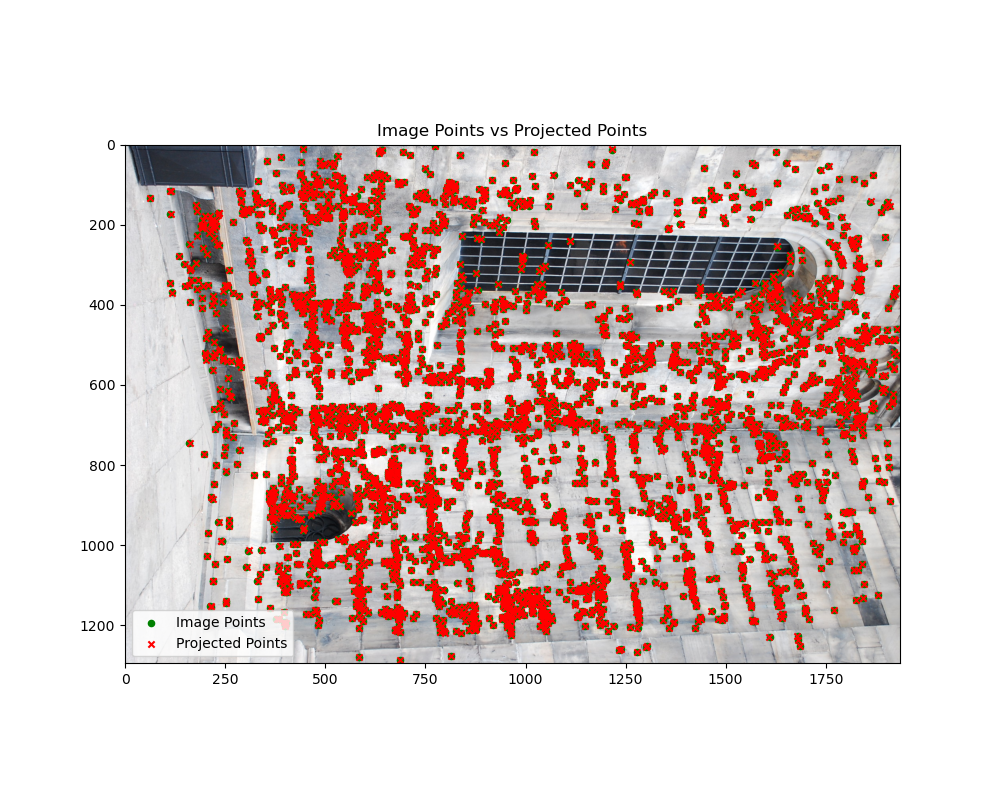

No such comm: debb5626d10f49fca464035a1c6e9524


In [3]:

# ------ Your code here ------ 
imfiles = data['imfiles'][0]
x_i= data['x'][0]
x_i=x_i[0]
P_i=P[0]
print(imfiles)
imgname=imfiles[0][0]
print(imgname)
#print(x_i)
#print(x_i.shape)
visible_mask = ~np.isnan(x_i[0, :]) 
X_vis = X[:, visible_mask] #3D points
x_vis = pflat(x_i[:, visible_mask]) #image points
#print(x_vis.shape)
proj_h = P_i @ X_vis    
proj=pflat(proj_h) #projected points

img = plt.imread(f"data/{imgname}")  
plt.close('all')
plt.figure(figsize=(10, 8))
plt.imshow(img)
plt.scatter(x_vis[0, :], x_vis[1, :], c='g', marker='o', s=20, label='Image Points')
plt.scatter(proj[0, :], proj[1, :], c='r', marker='x', s=20, label='Projected Points')
plt.legend()
plt.title('Image Points vs Projected Points')
plt.show()
   

#### Your answer here: 

(*Include answers to all questions marked in bold.*)
#
The projections are close to the corresponding image points


### Task 1.3
Using the two projective transformations 
\begin{equation}
T_1 = \left( \begin{array}{cccc}
1 & 0 & 0 & 0\\
0 & 3 & 0 & 0\\ 
0 & 0 & 1 & 0\\
1/8 & 1/8 & 0 & 1
\end{array} \right) \text{ and }
T_2 = \left( \begin{array}{cccc}
1 & 0 & 0 & 0\\
0 & 1 & 0 & 0\\ 
0 & 0 & 1 & 0\\
1/16 & 1/16 & 0 & 1
\end{array} \right),
\end{equation}

transform the 3D points ($\mathbf{X} \mapsto T_i\mathbf{X}$), and accordingly the cameras (as in *Theoretical Exercise 1*), so that two new projective solutions are obtained.

For each of the solutions, plot the 3D points and cameras in the same figure. (Don't forget to divide the points by the fourth coordinate before plotting, and again don't forget to use `ax.set_aspect('equal')`. Feel free to use the provided `pflat` function.)

**What has happened to the 3D points?**
**Does any of them appear reasonable?**

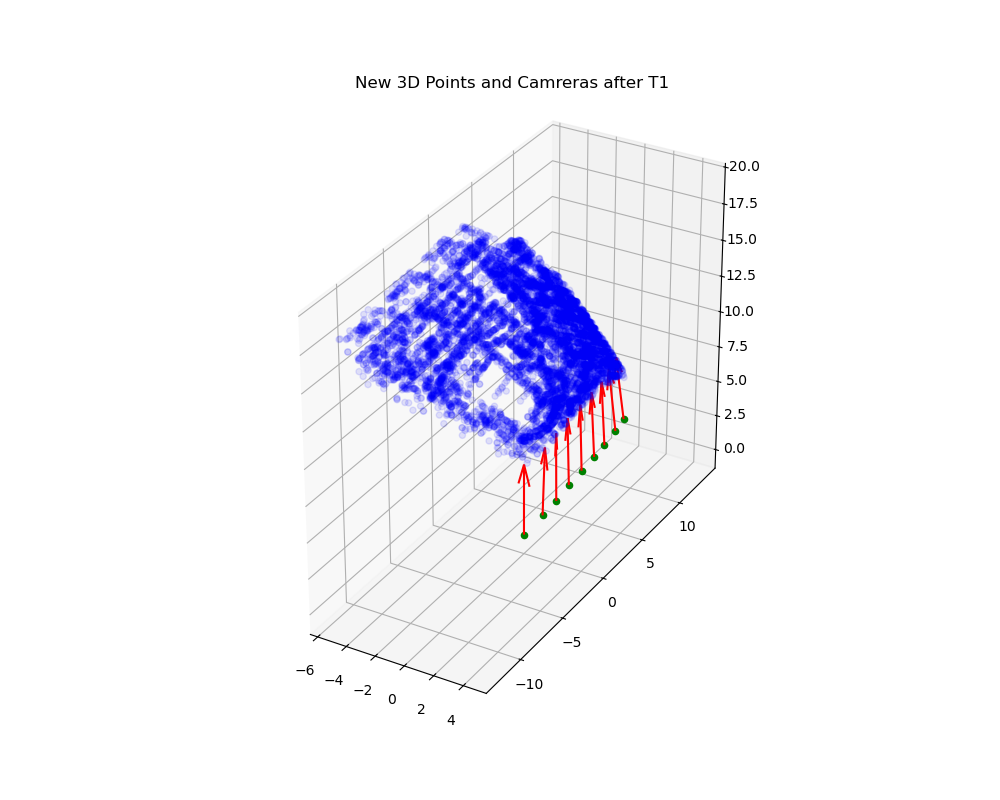

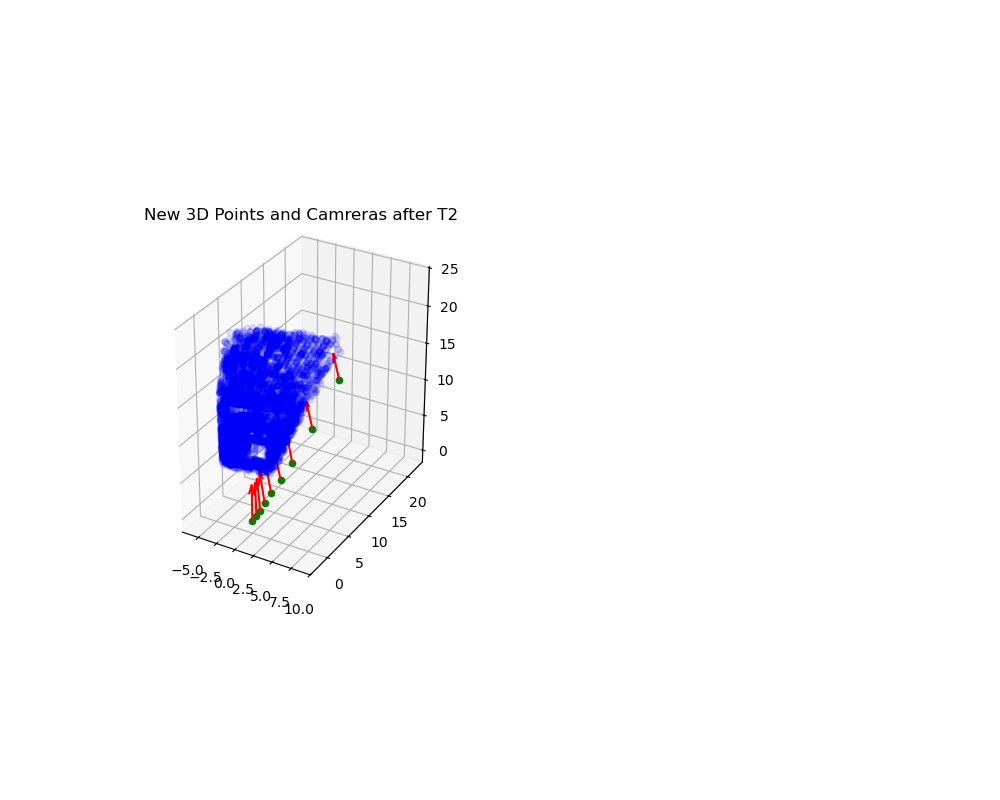

No such comm: 9cae6a84d3b24cc3903e6a8d905fee11


In [4]:

# ------ Your code here ------ 
T_1=np.array([[1,0,0,0,],[0,3,0,0],[0,0,1,0],[1/8,1/8,0,1]])
T_2=np.array([[1,0,0,0,],[0,1,0,0],[0,0,1,0],[1/16,-1/16,0,1]])
X_1 = T_1@X
X_2 = T_2@X

X1_flat = pflat(X_1)
X2_flat = pflat(X_2)

T_1_inv = np.linalg.inv(T_1)
T_2_inv = np.linalg.inv(T_2)

P_1=[None]*len(P)
P_2=[None]*len(P)

for i in range(len(P)):
    P_1[i] = P[i]@ T_1_inv  
    P_2[i] = P[i] @ T_2_inv

plt.close('all')
fig=plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
for i in range(len(P)):
    plot_camera(P_1[i], 5, ax=ax)
ax.scatter(X1_flat[0, :], X1_flat[1, :], X1_flat[2, :], c='b', marker='o', s=20, alpha=0.1)    
#ax.set_xlabel('X')
#ax.set_ylabel('Y') 
#ax.set_zlabel('Z')
ax.set_title('New 3D Points and Camreras after T1')
ax.set_aspect('equal') 
plt.show()

fig=plt.figure(figsize=(10, 8))
ax = fig.add_subplot(121, projection='3d')
for i in range(len(P)):
    plot_camera(P_2[i], 5, ax=ax)
ax.scatter(X2_flat[0, :], X2_flat[1, :], X2_flat[2, :], c='b', marker='o', s=20, alpha=0.1)    
#ax.set_xlabel('X')
#ax.set_ylabel('Y') 
#ax.set_zlabel('Z')
ax.set_title('New 3D Points and Camreras after T2')
ax.set_aspect('equal') 
plt.show()

### Your answer here: 

(*Include answers to all questions marked in bold.*)
#
After applying the projective transformations \(T_1\) and \(T_2\), the 3D points underwent a non-Euclidean transformation in projective space \(\mathbb{P}^3\). Although their absolute coordinates changed, the overall spatial distribution remained well-structured: the points did not collapse into a plane or line, and retained volumetric spread. This indicates that the transformations were non-degenerate.

The camera orientations remain directed toward the point cloud, and no vanishing or degenerate viewpoints are observed. Since projective transformations preserve the incidence and projection relationships between 3D points in the figures are reasonable.


### Task 1.4
For one of the 9 views, and for each of the new reconstructions (resulting from $T_1$ and $T_2$), project the new 3D points into its corresponding transformed camera.
Plot the pair of images along with the corresponding projected points, and the image points in the same figure. 
(Write a function `project_and_plot(P, Xs, xs, image)` that does this for you, it will be useful in the future.)

**How well do the projections and the image points align for the new reconstructions?**

[array(['DSC_0025.JPG'], dtype='<U12')
 array(['DSC_0026.JPG'], dtype='<U12')
 array(['DSC_0027.JPG'], dtype='<U12')
 array(['DSC_0028.JPG'], dtype='<U12')
 array(['DSC_0029.JPG'], dtype='<U12')
 array(['DSC_0030.JPG'], dtype='<U12')
 array(['DSC_0031.JPG'], dtype='<U12')
 array(['DSC_0032.JPG'], dtype='<U12')
 array(['DSC_0033.JPG'], dtype='<U12')]
1


Text(0.5, 1.0, 'Projection after T2')

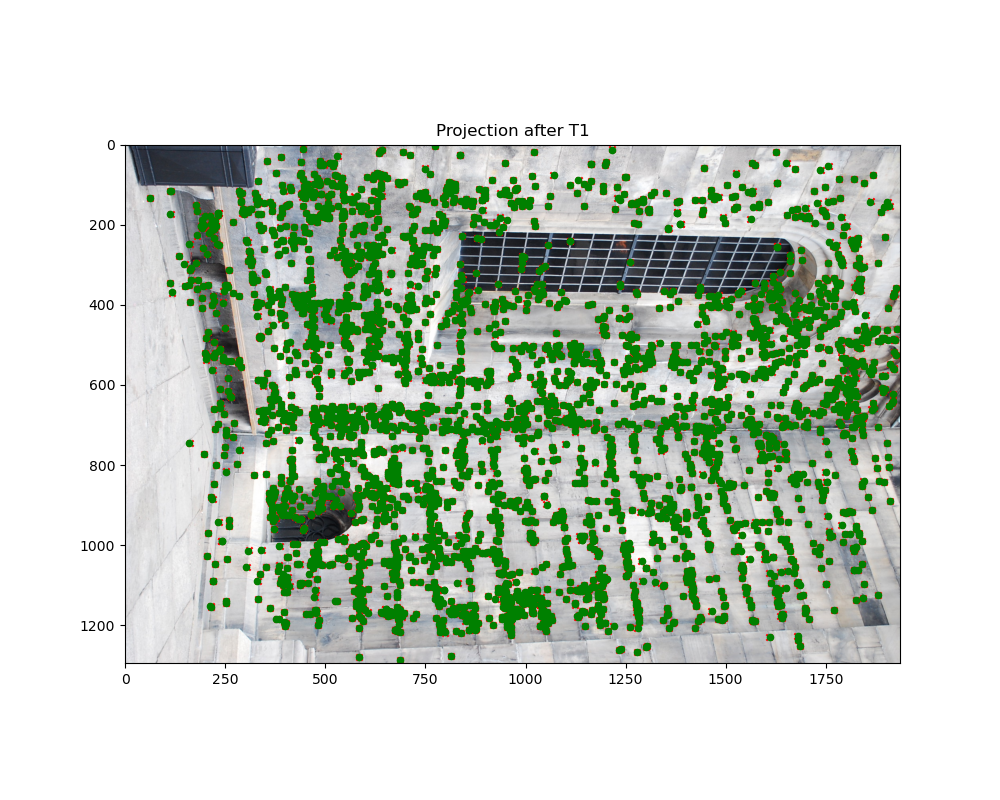

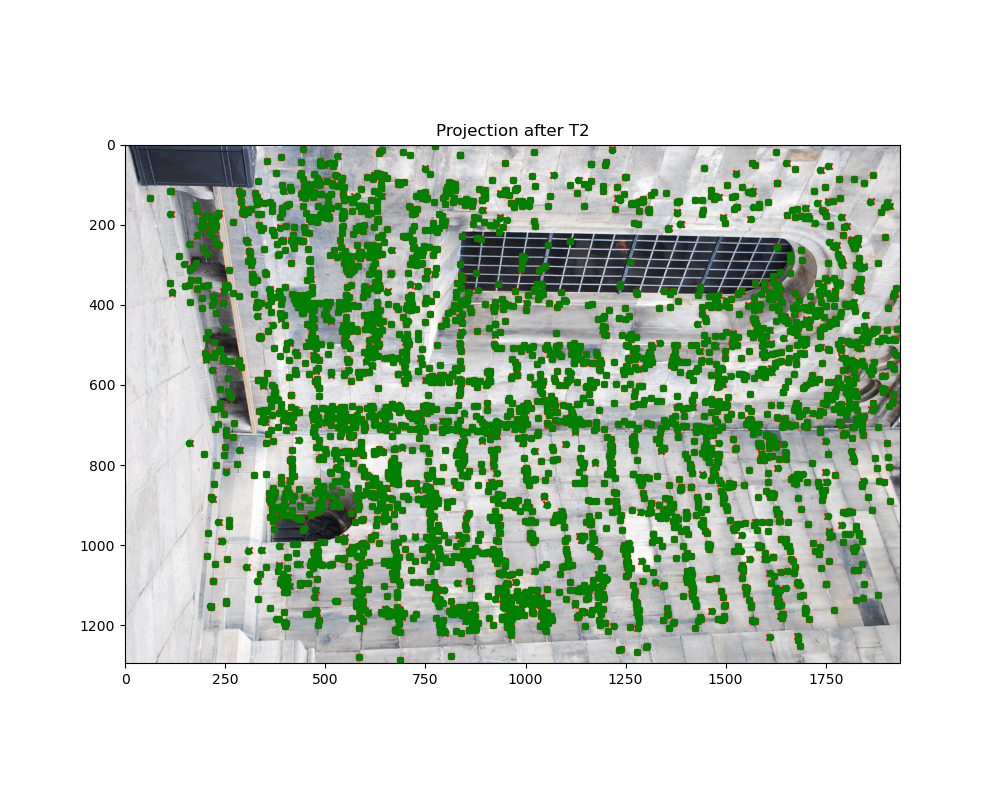

No such comm: 4dce57de2aaa4b33a5d207f0e146eacd
No such comm: 4dce57de2aaa4b33a5d207f0e146eacd
No such comm: 4dce57de2aaa4b33a5d207f0e146eacd
No such comm: 4dce57de2aaa4b33a5d207f0e146eacd
No such comm: 4dce57de2aaa4b33a5d207f0e146eacd
No such comm: 4dce57de2aaa4b33a5d207f0e146eacd
No such comm: 586afd065f6d4175ac30963d9d320128
No such comm: 586afd065f6d4175ac30963d9d320128
No such comm: 586afd065f6d4175ac30963d9d320128
No such comm: 586afd065f6d4175ac30963d9d320128
No such comm: 586afd065f6d4175ac30963d9d320128
No such comm: 586afd065f6d4175ac30963d9d320128


In [5]:
def project_and_plot(P, Xs, xs, image):
    # Your code here
    visible_mask = ~np.isnan(xs[0, :]) 
    Xs = Xs[:, visible_mask] 
    projected = P @ Xs
    projected = pflat(projected) 
    img=mpimg.imread(f"data/{image}")
    plt.imshow(img)
    plt.scatter(projected[0, :], projected[1, :], c='r', marker='x', s=20, label='Projected Points')
    plt.scatter(xs[0, visible_mask], xs[1, visible_mask], c='g', marker='o', s=20, label='Image Points')
    
# Project and plot the reconstruction resulting from T_1
plt.close('all')
plt.figure(figsize=(10, 8))
project_and_plot(P_1[0], X_1, x_i, imfiles[0][0])
plt.title('Projection after T1')

# Project and plot the reconstruction resulting from T_2
print(imfiles)
print(len(imfiles[0]))
plt.figure(figsize=(10, 8))
project_and_plot(P_2[0], X_2, x_i, imfiles[0][0])
plt.title('Projection after T2')

#### Your answer here: 

(*Include answers to all questions marked in bold.*)
#
By plotting both the projected points (red crosses) and the original image points (green circles), we can directly assess the alignment. For both reconstructions with 𝑇1 and 𝑇2, the projections overlap well with the image points, confirming that the projective transformations preserve the projection geometry.

#### *Theoretical exercises: 2* (see pdf)

# Camera Calibration

#### *Theoretical exercises: 3* (see pdf)

# RQ Factorization and Computation of $K$

#### *Theoretical exercises: 4* (see pdf)

# Direct Linear Transformation DLT

#### *Theoretical exercises: 5 and 6* (see pdf)

## Computer Exercise 2
Figure 2 shows two images `cube1.JPG` and `cube2.JPG` of a scene with a Rubik's cube. 
The file `compEx2data.mat` contains a point model `Xmodel` of the visible cube sides, the measured projections `x` of the model points
in the two images and two variables `startind`, `endind` that can be used for plotting lines on the model surface.

<figure align="center">
    <img alt="left" src="figs/cube1.JPG" width="250px">
&nbsp; &nbsp; &nbsp; &nbsp;
    <img alt="right" src="figs/cube2.JPG" width="250px">
    <figcaption>Figure 2: Two images of a scene containing a Rubik's cube.</figcaption>
</figure>

The goal for this exercise is to determine the camera for each of the two views, i.e. resectioning.
*You should consider one view at a time*, i.e. apply your code for each view separately.

### Task 2.1
Normalize the measured points by applying a transformation $N$ that subtracts the mean of the points and then re-scales the coordinates by the standard deviation.
Here, compute mean and standard deviation for $x$ and $y$ separately (separating the coordinates is not crucial, but it helps during grading if you do this in a coherent way).

Plot the normalized points in a new figure. Verify that the points are centered around $(0,0)$ with standard deviation 1 for each of the coordinates.

Remember to print out the mean and standard deviation you used for normalizing x and y, for each camera.

(3, 37)
mu_x1: 1014.8534437663469 839.0382565664256
sigma_x1: 193.9348494348486 195.8207116811975
mu_x2: 930.9657367044463 795.1859535591931
sigma_x2: 195.71450086643424 196.72253529302543


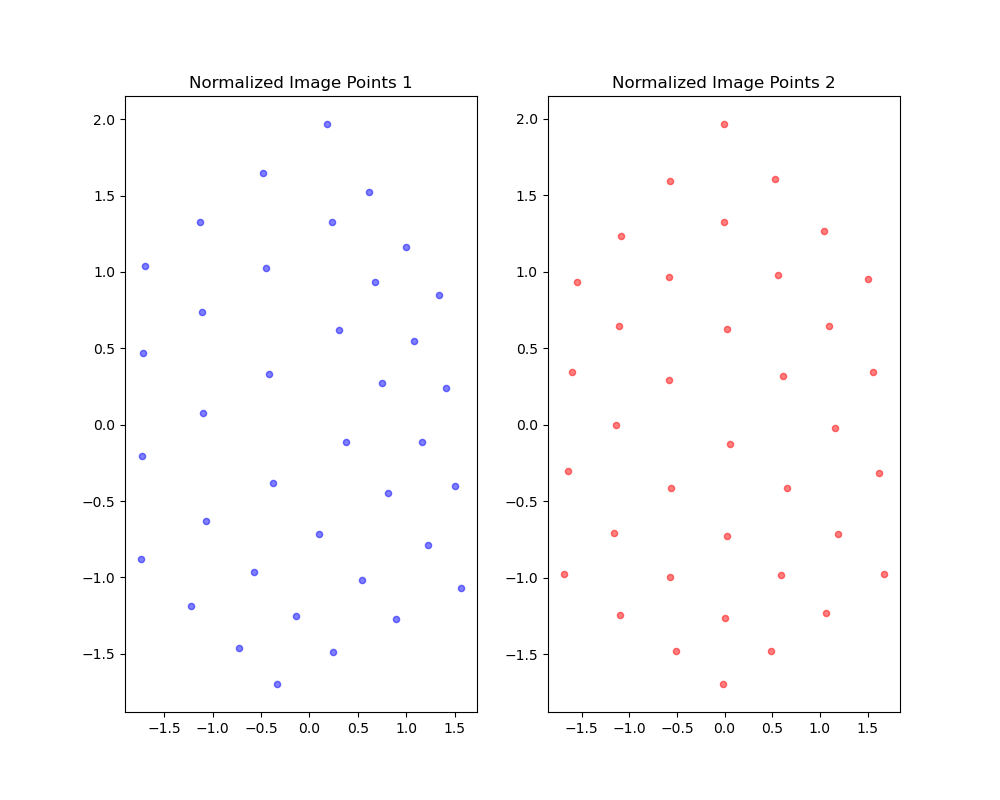

No such comm: a9122b90e4254d85962b1d01148bd034
No such comm: fc8efdfacdd44323bc27e14557e112c5


No such comm: 67074b3cbeaf481f835bb8f23b3e65f3
No such comm: 67074b3cbeaf481f835bb8f23b3e65f3
No such comm: 67074b3cbeaf481f835bb8f23b3e65f3
No such comm: 67074b3cbeaf481f835bb8f23b3e65f3
No such comm: 67074b3cbeaf481f835bb8f23b3e65f3
No such comm: 67074b3cbeaf481f835bb8f23b3e65f3


In [ ]:

# ------ Your code here ------ 
data = scipy.io.loadmat('data/compEx2data.mat')
Xmodel=data['Xmodel']
#print(Xmodel)
X=data['Xmodel']
x=data['x'][0]
x1=x[0]
x2=x[1]

print(x1.shape)

mu_x1_x = np.mean(x1[0, :])
mu_x1_y = np.mean(x1[1, :])

sigma_x1_x = np.std(x1[0, :])
sigma_x1_y = np.std(x1[1, :])

mu_x2_x = np.mean(x2[0, :])
mu_x2_y = np.mean(x2[1, :])

sigma_x2_x = np.std(x2[0, :])
sigma_x2_y = np.std(x2[1, :])

print("mu_x1:", mu_x1_x, mu_x1_y)
print("sigma_x1:", sigma_x1_x, sigma_x1_y)
print("mu_x2:", mu_x2_x, mu_x2_y)
print("sigma_x2:", sigma_x2_x, sigma_x2_y)

N1=np.array([[1/sigma_x1_x,0,-mu_x1_x/sigma_x1_x],
            [0,1/sigma_x1_y,-mu_x1_y/sigma_x1_y],
            [0,0,1]])
N2=np.array([[1/sigma_x2_x,0,-mu_x2_x/sigma_x2_x],
            [0,1/sigma_x2_y,-mu_x2_y/sigma_x2_y],
            [0,0,1]])

x1_norm = N1 @ x1
x2_norm = N2 @ x2

plt.close('all')
plt.figure(figsize=(10, 8))
plt.subplot(1, 2, 1)
plt.scatter(x1_norm[0, :], x1_norm[1, :], c='b', marker='o', s=20, alpha=0.5)
plt.title('Normalized Image Points 1')
plt.subplot(1, 2, 2)
plt.scatter(x2_norm[0, :], x2_norm[1, :], c='r', marker='o', s=20, alpha=0.5)
plt.title('Normalized Image Points 2')
plt.show()

### Task 2.2
Implement a function `estimate_camera_DLT` that sets up the DLT equations for resectioning, and solves the resulting homogeneous least squares system using SVD.

$$\min_{||v||^2 = 1}||Mv||^2$$

**Is the smallest singular value close to zero? How about $||Mv||$?**


**Useful python commands:**

`U, S, Vt = np.linalg.svd(M)` # compute SVD of a matrix

In [7]:
def estimate_camera_DLT(x, Xmodel):
    # Your code here
    X_model = np.vstack([Xmodel, np.ones((1, Xmodel.shape[1]))]) 
    N = X_model.shape[1]
    M = []

    for i in range(N):
        Xi = X_model[:, i]
        xi = x[:, i]

        row1 = np.hstack([np.zeros(4), -xi[2]*Xi, xi[1]*Xi])
        row2 = np.hstack([xi[2]*Xi, np.zeros(4), -xi[0]*Xi])
        M.append(row1)
        M.append(row2)

    M = np.array(M)  
    
    U, S, Vt = np.linalg.svd(M)
    v = Vt[-1]  
    return M,v

M1,v1 = estimate_camera_DLT(x1_norm, Xmodel)
mv_norm = np.linalg.norm(M1 @ v1)
mv_norm_squared = mv_norm ** 2
print("||Mv||^2 squared for image 2 =", mv_norm_squared)
print("||Mv|| for image 2 =", mv_norm)

M2,v2= estimate_camera_DLT(x2_norm, Xmodel)
mv2_norm = np.linalg.norm(M2 @ v2)
mv2_norm_squared = mv2_norm ** 2
print("||Mv||^2 squared for image 2 =", mv2_norm_squared)
print("||Mv|| for image 2 =", mv2_norm)


||Mv||^2 squared for image 2 = 0.0026044835613712406
||Mv|| for image 2 = 0.05103414113484463
||Mv||^2 squared for image 2 = 0.0019168795522736058
||Mv|| for image 2 = 0.04378218304600178


#### Your answer here: 

(*Include answers to all questions marked in bold.*)
#
The smallest singular value close to zero. The smallest value of $||Mv||$ is close to zero as well.

### Task 2.3
Extract the entries of the camera from the solution and set up the camera matrix.
Make sure that you select the solution where the points are in front of the camera.
(If $X$ has 4th coordinate 1 then the 3rd coordinate of $PX$ should be positive for $X$ to be in front of the camera.)

Project the model points into the images. (Don't forget to transform the camera matrix to the original (un-normalized) coordinate system, as in *Theoretiacl Exercise 6*, before projecting.) Plot the measured image points in the same figure. **Are they close to each other?** Also make a 3D plot visualizing the camera centers, principal axes, as well as the 3D model points.
**Does the result look reasonable?**

Third row of projected points: [-0.43472476 -0.45585916 -0.47699357 -0.49812797 -0.42091576 -0.44205016
 -0.46318457 -0.48431897 -0.40710676 -0.42824116 -0.44937557 -0.47050997
 -0.39329775 -0.41443216 -0.43556656 -0.45670097 -0.40661595 -0.42775035
 -0.44888475 -0.47001916 -0.41993414 -0.44106854 -0.46220295 -0.48333735
 -0.43325233 -0.45438673 -0.47552114 -0.49665554 -0.44804295 -0.46136114
 -0.47467933 -0.43423395 -0.44755214 -0.46087033 -0.42042495 -0.43374314
 -0.44706133]
Third row of projected points: [-0.43643588 -0.45372519 -0.47101449 -0.48830379 -0.42132644 -0.43861574
 -0.45590504 -0.47319434 -0.40621699 -0.42350629 -0.4407956  -0.4580849
 -0.39110755 -0.40839685 -0.42568615 -0.44297545 -0.4086861  -0.4259754
 -0.4432647  -0.460554   -0.42626464 -0.44355394 -0.46084324 -0.47813255
 -0.44384319 -0.46113249 -0.47842179 -0.49571109 -0.45401443 -0.47159298
 -0.48917153 -0.43890499 -0.45648353 -0.47406208 -0.42379554 -0.44137409
 -0.45895264]


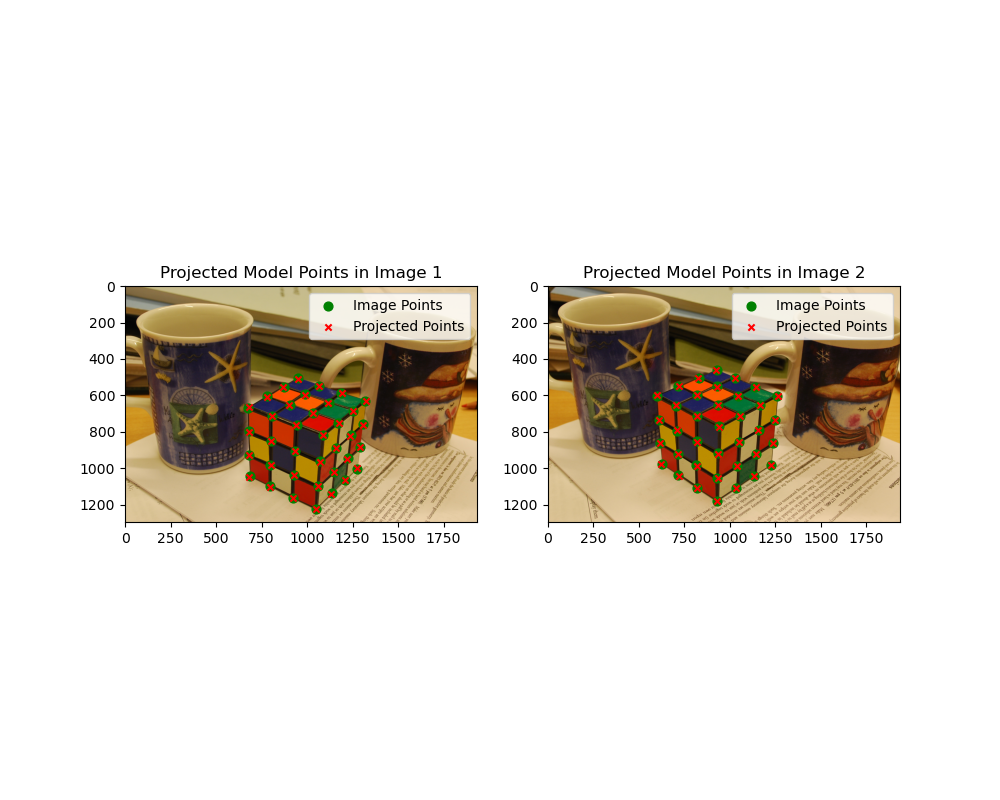

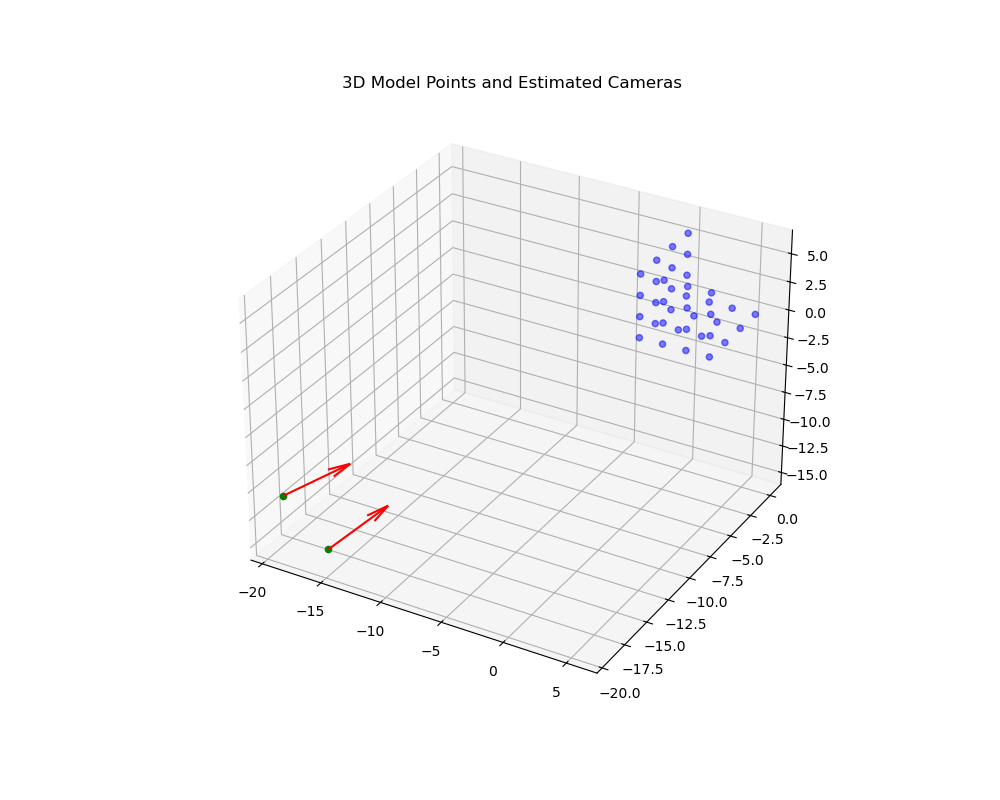

In [ ]:

# ------ Your code here ------ 

# extract the camera matrices
P1 = v1.reshape(3, 4)
P2 = v2.reshape(3, 4)
P1_unnorm = np.linalg.inv(N1) @ P1
P2_unnorm = np.linalg.inv(N2) @ P2

# Project and plot the models points into the images
X_model_hom = np.vstack([Xmodel, np.ones((1, Xmodel.shape[1]))])
x1_proj_h = P1_unnorm @ (X_model_hom)
x2_proj_h = P2_unnorm @ (X_model_hom)
print("Third row of projected points:", x1_proj_h[2, :])
print("Third row of projected points:", x2_proj_h[2, :])
P1_unnorm=-P1_unnorm
P2_unnorm=-P2_unnorm
x1_proj_h = P1_unnorm @ (X_model_hom)
x2_proj_h = P2_unnorm @ (X_model_hom)
x1_proj = pflat(x1_proj_h)
x2_proj = pflat(x2_proj_h)

img1=mpimg.imread(f"data/cube1.JPG")
img2=mpimg.imread(f"data/cube2.JPG")
plt.close('all')
plt.figure(figsize=(10, 8))
plt.subplot(1, 2, 1)
plt.imshow(img1)
plt.scatter(x1[0, :], x1[1, :], c='g', marker='o', s=40, label='Image Points')
plt.scatter(x1_proj[0, :], x1_proj[1, :], c='r', marker='x', s=20, label='Projected Points')
plt.legend()
plt.title('Projected Model Points in Image 1')
plt.subplot(1, 2, 2)
plt.imshow(img2)
plt.scatter(x2[0, :], x2[1, :], c='g', marker='o', s=40, label='Image Points')
plt.scatter(x2_proj[0, :], x2_proj[1, :], c='r', marker='x', s=20, label='Projected Points')
plt.legend()
plt.title('Projected Model Points in Image 2')
plt.show()
# Make a 3D plot with 3D model points, camera centers, and principal axes
ax=plt.figure(figsize=(10, 8))
ax = plt.subplot(111, projection='3d')
ax.scatter(Xmodel[0, :], Xmodel[1, :], Xmodel[2, :], c='b', marker='o', s=20, alpha=0.5)
plot_camera(P1_unnorm, 5, ax=ax)
plot_camera(P2_unnorm, 5, ax=ax)
plt.title('3D Model Points and Estimated Cameras')
plt.show()

### Your answer here: 

(*Include answers to all questions marked in bold.*)
#
The measured image points in the same figure are closed to projected points. The result looks reasonable with cameras facing the model and points distributed in front.

### Task 2.4
Compute the inner parameters of the first camera using RQ decomposition. 

**How can we know that these are the "true" parameters? Why is there no ambiguity as in Theoretical Exercise 1?**

Please also print out the calibration matrix of the first camera, normalized s.t. $K_{33}=1$.

When you have achieved satisfactory results, save the camera matrices (for both views) to be used in further exercises.

**Useful python commands:**

`scipy.linalg.rq(P)` # compute the RQ decomposition of a matrix

In [ ]:

# ------ Your code here ------
K1,R1=scipy.linalg.rq(P1_unnorm[:,:3])
K1=K1/K1[2,2]
T = np.diag(np.sign(np.diag(K1)))
K1 = K1 @ T
R1 = T @ R1
P1_calibrated = np.linalg.inv(K1) @ P1_unnorm   
print("Camera 1 Calibration Matrix K1:\n", K1)

scipy.io.savemat("data\cameras.mat", {"P1": P1_unnorm, "P2": P2_unnorm})

Camera 1 Calibration Matrix K1:
 [[ 2.42183633e+03 -6.77588216e+00  9.80194001e+02]
 [ 0.00000000e+00  2.42003888e+03  6.93975417e+02]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


### Your answer here: 

(*Include answers to all questions marked in bold.*)
#
The RQ decomposition yields a unique calibration matrix 𝐾 when the matrix is invertible and the diagonal entries are constrained to be positive. Unlike in Theoretical Exercise 1, where ambiguity arises from simultaneous estimation of 
𝑃 and 𝑋, here 𝑃 is fixed numerically, which constrains the form of 𝑋 and removes ambiguity.

### Task 2.5 (OPTIONAL, 10 optional points)
You will now re-run your experiments in a few different settings to be compared, investigating the importance of normalization. You only need to do this part for **the first view** (corresponding to 2D points `x{1}`). For each experiment, measure the performance with the RMS error 

$$
\begin{equation}
e_{RMS} = \sqrt{ \frac{1}{n} ||x_{meas} - x_{proj}||_F^2 },
\end{equation}
$$

where $x_{meas}$, $x_{proj}$ are the Cartesian coordinates ($2\times n$-matrices) for the measured points and projected model points respectively, and $n$ is the number of points. Here $|| \cdot ||_F^2$ denotes the (squared) Frobenius norm.

**Useful python commands:**

`np.linalg.norm(dx, 'fro') ** 2` # compute the squared Frobenius norm

In [ ]:
def e_rms(x_measured, x_projected):
    # Your code here
    dx=x_measured - x_projected
    RMS= np.sqrt(np.linalg.norm(dx,'fro')**2/x_measured.shape[1])
    return RMS    

First compute RMS values when using normalization (as you have done so far).
Next, repeat the whole resectioning experiment one more time, but this time don't normalize the points. (The easiest way of doing this is probably to use $N=I$ as normalization matrix and run the same code again.)

**Is the difference large?** 

Report the RMS number and explain your findings.

In [ ]:


P1_pixel = np.linalg.inv(N1) @ P1
x1_model = data['x'][0,0]         

print(x1_model.shape)
RMS_norm1_pixel = e_rms(x1_model, pflat(P1_pixel @ X_model_hom))

print("RMS error for normalized image 1:", RMS_norm1_pixel) 

v1=estimate_camera_DLT(x1_model, Xmodel)[1] 


P1_unnorm = v1.reshape(3, 4) 

RM1_unnorm = e_rms(x1_model, pflat(P1_unnorm @ X_model_hom)) 

print("RMS error for unnormalized image 1:", RM1_unnorm) 


(3, 37)
RMS error for normalized image 1: 3.571192758079109
RMS error for unnormalized image 1: 3.571624074461925


### Your answer here: 

(*Include answers to all questions marked in bold.*)
#
Normalized RMS: Image 1 ≈ 3.5719

Unnormalized RMS: Image 1 ≈ 3.5716

Findings:

The difference is negligible. Normalization has little effect on RMS here, likely because the point coordinates are well-scaled. However, normalization is generally recommended to improve numerical stability, especially for larger or poorly scaled datasets.

Now repeat the resectioning experiments (with and without normalization), but this time estimate the camera using only points number $1,4,13,16,25,28,31$. Still, measure the RMS error in a unified way, always using all points!.

**What can you conclude from the experiments that you have run?**

In [ ]:

# ------ Your code here ------
selected_indices = np.array([1, 4, 13, 16, 25, 28, 31]) - 1
x1_selected = x1_model[:2, selected_indices]
x1_selected_hom = np.vstack((x1_selected, np.ones((1, x1_selected.shape[1]))))
v1_selected=estimate_camera_DLT(x1_selected_hom, Xmodel[:, selected_indices])[1]
P1_selected = v1_selected.reshape(3, 4)
RMS1_selected = e_rms(x1_model, pflat(P1_selected @ X_model_hom))
print("RMS error (unnormalized, all points) image 1:", RMS1_selected)

x1_norm_selected = x1_norm[:, selected_indices]
x1_norm_selected_hom = np.vstack((x1_norm_selected, np.ones((1, x1_norm_selected.shape[1]))))
v1_norm_selected=estimate_camera_DLT(x1_norm_selected_hom, Xmodel[:, selected_indices])[1]
P1_norm_selected = v1_norm_selected.reshape(3, 4)
P1_pixel_selected = np.linalg.inv(N1) @ P1_norm_selected

RMS1_norm_pixel = e_rms(x1_model, pflat(P1_pixel_selected @ X_model_hom))

print("RMS error (normalized, all points) image 1:", RMS1_norm_pixel)

RMS error (unnormalized, all points) image 1: 4.191299473682884
RMS error (normalized, all points) image 1: 4.187243488202885



### Your answer here: 

(*Include answers to all questions marked in bold.*)
#
Estimating the camera from fewer points reduces accuracy, as expected. Normalization slightly improves the results, but the difference is small. This shows that using more points provides a more stable and accurate camera estimation.

# Feature Extraction and Matching using SIFT

## Computer Exercise 3
In this exercise you will get to try feature extraction using SIFT.

You will need `OpenCV` package for computing SIFT features so first make sure that you have the package installed and successfully imported. 

### Task 3.1
First load the images `cube1.jpg` and `cube2.jpg` from Computer Exercise 2. We will work with **grayscale** images for SIFT.

Compute SIFT features using OpenCV’s implementation of SIFT. 

**Useful python commands:**

`sift = cv2.SIFT_create(contrastThreshold=0.01)` # initialize a sift detector

`keypoints1, descriptors1 = sift.detectAndCompute(im1, None)` # compute keypoints and descriptors


The SIFT detector searches for peaks in scale space (similar to peaks in the autocorrelation function, see lecture notes). The `contrastThreshold` parameter filters out weak peaks.

The variable `keypoints1` contains a list of detected features `kp`. Each keypoint has: 
- `kp.pt` -- $(x, y)$ coordinates
- `kp.angle` -- an orientation
- `kp.size` -- a scale

and the descriptor in `descriptors1` encodes local image information around that point.


In [ ]:

# ------ Your code here ------

# load images in greyscale
img1 = cv2.imread('data/cube1.jpg', cv2.IMREAD_GRAYSCALE)
img2 = cv2.imread('data/cube2.jpg', cv2.IMREAD_GRAYSCALE)
# compute keypoints and descriptors for both images
sift =cv2.SIFT_create(contrastThreshold=0.01)
keypoints1, descriptors1 = sift.detectAndCompute(img1, None)
keypoints2, descriptors2 = sift.detectAndCompute(img2, None)


Visualize the detected keypoints with the images.
```
im1_kp = cv2.drawKeypoints(im1, keypoints1, None,
                           flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
```


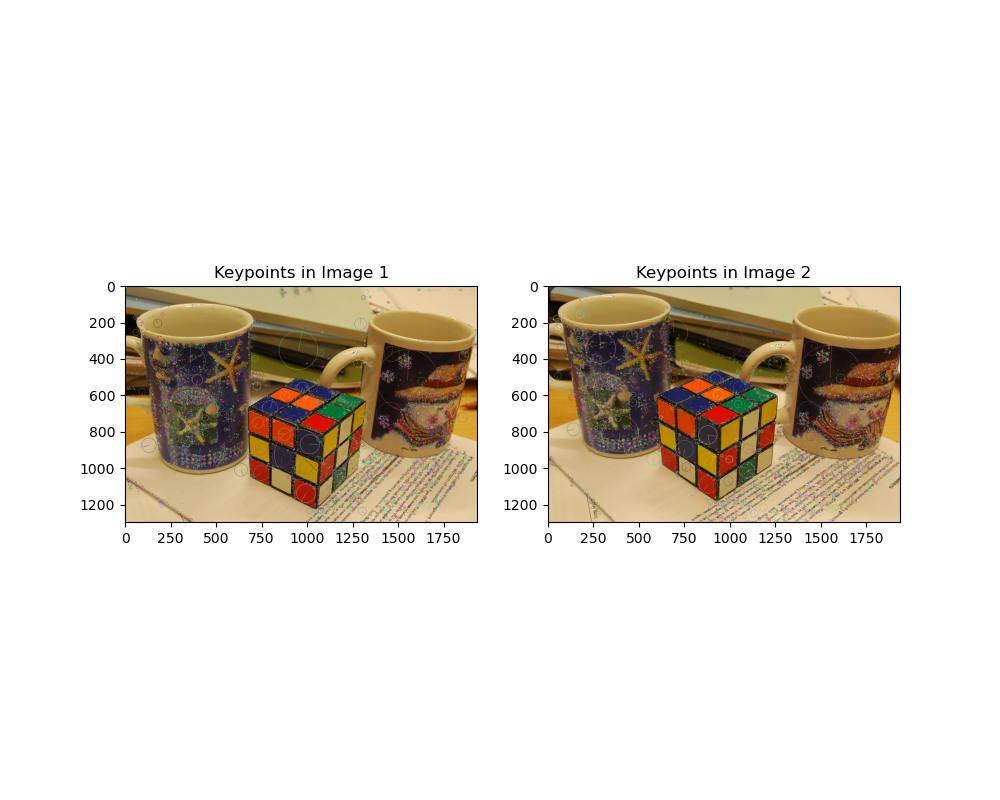

In [ ]:

# ------ Your code here ------
im1_kp = cv2.drawKeypoints(img1, keypoints1, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
im2_kp = cv2.drawKeypoints(img2, keypoints2, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

plt.close('all')
plt.figure(figsize=(10, 8))
plt.subplot(1, 2, 1)
plt.imshow(im1_kp, cmap='gray')
plt.title('Keypoints in Image 1')
plt.subplot(1, 2, 2)
plt.imshow(im2_kp, cmap='gray')
plt.title('Keypoints in Image 2')
plt.show()


### Task 3.2
We now want to find correspondences between the two sets of SIFT descriptors.

```
bf = cv2.BFMatcher(cv2.NORM_L2)
matches = bf.knnMatch(descriptors1, descriptors2, k=2)
```

For each descriptor in the first image, `bf.knnMatch.knnMatch()` returns `k` best matches in the second image, where `k=2` by default. 

However, sometimes a feature may have two or more similarly good matches, especially in textured or repetitive regions — these are ambiguous and should not be trusted.

We can apply **Lowe's ratio test** to filter out these ambiguous matches by comparing the distance of the best match (`m`) to the second-best match (`n`) and keep only the matches if the best match is much better than the second best (e.g. `m.distance < 0.75 * n.distance`).

Otherwise, both matches are almost equally good, the match is ambiguous, and we should reject it.

In [ ]:

# ------ Your code here ------

# Compute matches between descriptors1 and descriptors2
bf = cv2.BFMatcher(cv2.NORM_L2)
matches = bf.knnMatch(descriptors1, descriptors2, k=2)

# Apply Lowe's ratio test to filter out the ambiguous mathes
good_matches = []
for m, n in matches:
    if m.distance < 0.75 * n.distance:
        good_matches.append(m)
print(f"Number of good matches: {len(good_matches)}")   



Number of good matches: 2895


### Task 3.3
We can now extract matching points as follows. (Note that you will need the point sets $x1$ and $x2$ for the next exercise.)
```
x1 = np.array([keypoints1[m.queryIdx].pt for m in good_matches]).T
x2 = np.array([keypoints2[m.trainIdx].pt for m in good_matches]).T
```

Randomly select 10 matches, plot the two images next to each other and plots lines between the matching points.

**How many of the matches appear to be correct?**

**Useful python commands:**

```
im_matches = cv2.drawMatchesKnn(im1, keypoints1,
                                im2, keypoints2,
                                selected_matches, None,
                                flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
```

Text(0.5, 1.0, 'Matching Points between Image 1 and Image 2')

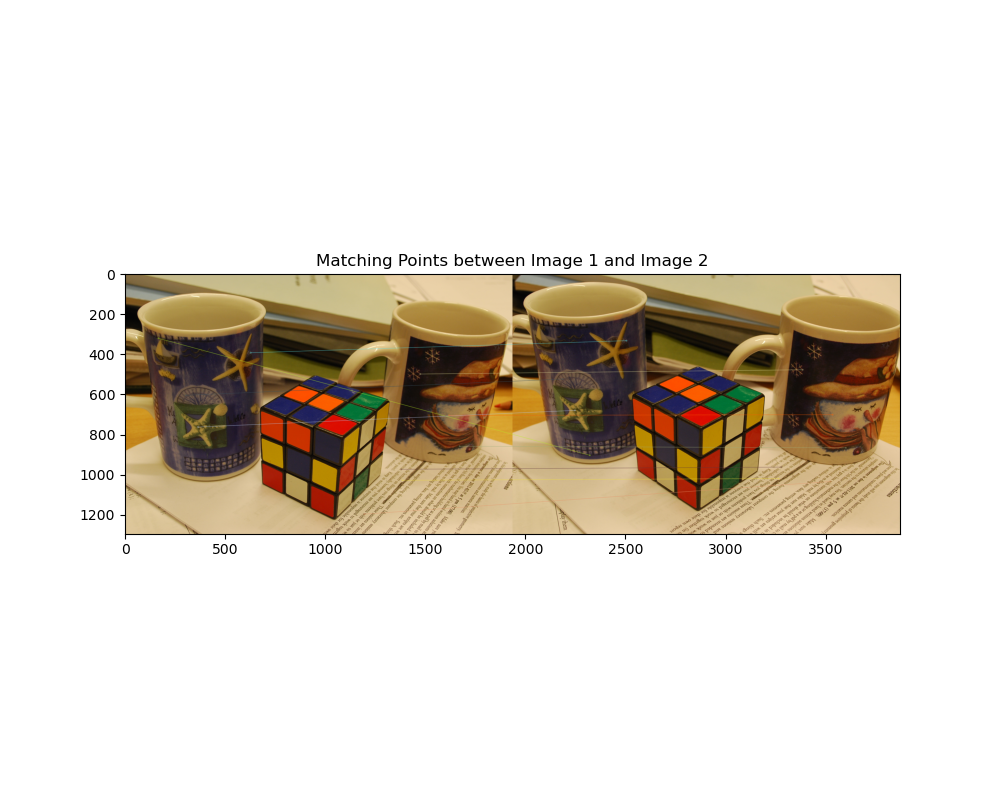

In [ ]:

# ------ Your code here ------

# Extract matching points
x1 = np.array([keypoints1[m.queryIdx].pt for m in good_matches]).T  # Points from image 1
x2 = np.array([keypoints2[m.trainIdx].pt for m in good_matches]).T  # Points from image 2
# Plot matching points on the two images
import random
selected_matches = random.sample(good_matches,10)  
im_matches = cv2.drawMatches(img1, keypoints1, img2, keypoints2, selected_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.close('all')
plt.figure(figsize=(10, 8))
plt.imshow(im_matches)
plt.title('Matching Points between Image 1 and Image 2')


### Your answer here: 

(*Include answers to all questions marked in bold.*)
#
Based on visual inspection of the 10 randomly selected matches, most of them appear to be correct — the lines connect visually similar regions across the two images. However, a few matches may be ambiguous or slightly misaligned due to repetitive textures or perspective changes.

# Triangulation using DLT

## Computer Exercise 4
Using the estimated cameras from Computer Exercise 2 you will now triangulate the points detected in Computer Exercise 3.

### Task 4.1
Implement a function `triangulate_3D_point_DLT` that set ups the DLT equations for triangulation, and solves the homogeneous least squares system.
(You will have to do this in a loop, once for each point.)

In [ ]:
def triangulate_3D_point_DLT(x1, x2, P1, P2):
    # Your code here
  A = np.array([
    x1[0] * P1[2,:] - P1[0,:],
    x1[1] * P1[2,:] - P1[1,:],
    x2[0] * P2[2,:] - P2[0,:],
    x2[1] * P2[2,:] - P2[1,:]
])
  _,_,Vt = np.linalg.svd(A)
  X = Vt[-1]
  X = X / X[-1]
  return X
  


Project the computed points into the two images and compare with the corresponding SIFT-points in a 2D plot.

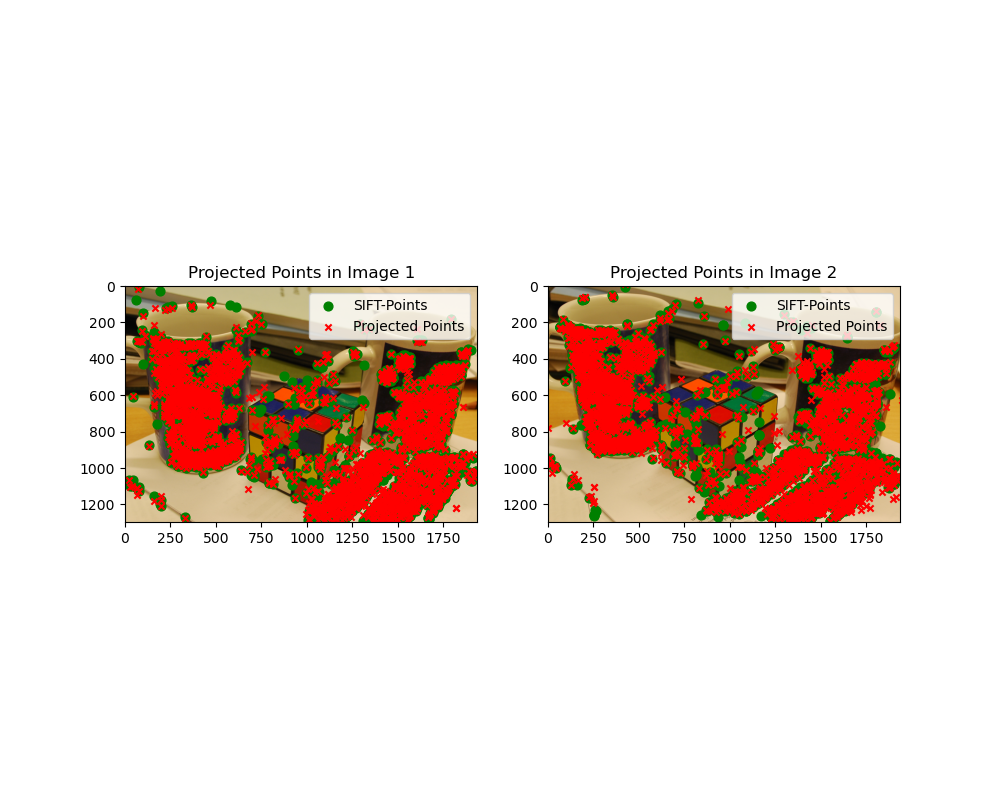

In [ ]:

# ------ Your code here ------

# Compute the 3D points
data=scipy.io.loadmat('data/cameras.mat')
P1_unnorm=data['P1']
P2_unnorm=data['P2']
X_list = []
for i in range(x1.shape[1]):
    pt1 = x1[:, i]
    pt2 = x2[:, i]
    X_i = triangulate_3D_point_DLT(pt1, pt2, P1_unnorm, P2_unnorm)
    X_list.append(X_i)

X = np.array(X_list).T
# Project the computed points into the two images
x_proj_1 = pflat(P1_unnorm@X)
x_proj_2 = pflat(P2_unnorm@X)
plt.close('all')
plt.figure(figsize=(10, 8))
plt.subplot(1, 2, 1)
plt.imshow(img1, cmap='gray')
plt.scatter(x1[0, :], x1[1, :], c='g', marker='o', s=40, label='SIFT-Points')
plt.scatter(x_proj_1[0, :], x_proj_1[1, :], c='r', marker='x', s=20, label='Projected Points')
plt.xlim(0, img1.shape[1])
plt.ylim(img1.shape[0], 0) 
plt.legend()
plt.title('Projected Points in Image 1')
plt.subplot(1, 2, 2)
plt.imshow(img2, cmap='gray')
plt.scatter(x2[0, :], x2[1, :], c='g', marker='o', s=40, label='SIFT-Points')
plt.scatter(x_proj_2[0, :], x_proj_2[1, :], c='r', marker='x', s=20, label='Projected Points')
plt.xlim(0, img1.shape[1])
plt.ylim(img1.shape[0], 0) 
plt.legend()
plt.title('Projected Points in Image 2')
plt.show()

### Task 4.2
Now, re-run the triangulation, but first normalize 2D points and cameras using the inverse of $K$. Again, compare with the SIFT points in a plot.
Just as when normalizing with $N$ (based on mean/std) for the resection problem in Computer Exercise 2, how is your result for triangulation from normalization compared to the result without normalization? Note that using $K$ or $N$ for normalization doesn't matter much, but $K$ was not available for the previous problem (resection).

(2, 2895)


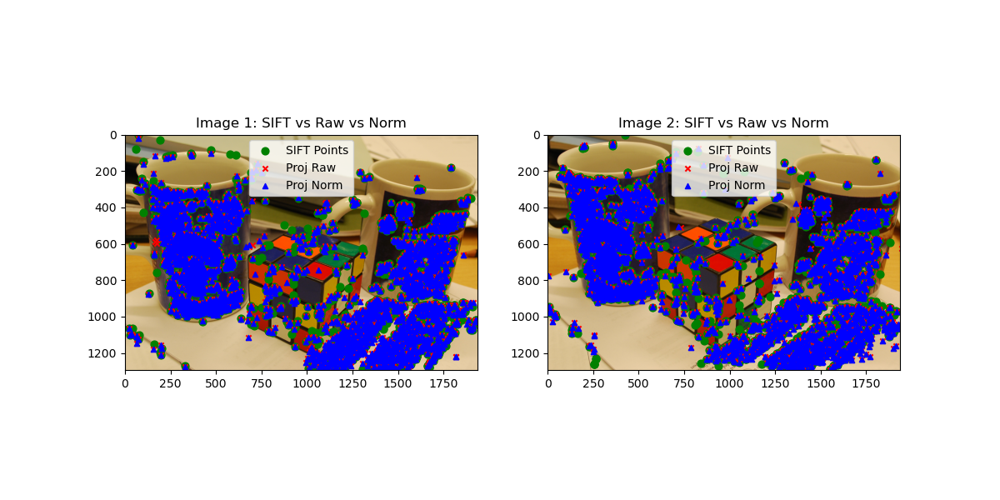

In [ ]:

# ------ Your code here ------
print(x1.shape)
x1_h = np.vstack((x1, np.ones((1, x1.shape[1]))))  
x2_h = np.vstack((x2, np.ones((1, x2.shape[1]))))
x1_norm =np.linalg.inv(K1) @ (x1_h)
x2_norm =np.linalg.inv(K1) @ (x2_h)

P1_norm = np.linalg.inv(K1) @ P1_unnorm
P2_norm = np.linalg.inv(K1) @ P2_unnorm

X_list = []
for i in range(x1.shape[1]):
    X_i = triangulate_3D_point_DLT(x1_norm[:, i], x2_norm[:, i], P1_norm, P2_norm)
    X_list.append(X_i)

X = np.array(X_list).T

x1_proj = pflat(P1_unnorm @ X)
x2_proj = pflat(P2_unnorm @ X)


fig, axs = plt.subplots(1, 2, figsize=(12, 6))

axs[0].imshow(img1, cmap='gray')
axs[0].scatter(x1[0], x1[1], c='g', marker='o', s=40, label='SIFT Points')
axs[0].scatter(x_proj_1 [0], x_proj_1 [1], c='r', marker='x', s=20, label='Proj Raw')
axs[0].scatter(x1_proj[0], x1_proj[1], c='b', marker='^', s=20, label='Proj Norm')
axs[0].set_title("Image 1: SIFT vs Raw vs Norm")
axs[0].set_xlim(0, img.shape[1])
axs[0].set_ylim(img.shape[0], 0) 
axs[0].legend()

 
axs[1].imshow(img2, cmap='gray')
axs[1].scatter(x2[0], x2[1], c='g', marker='o', s=40, label='SIFT Points')
axs[1].scatter(x_proj_2 [0], x_proj_2[1], c='r', marker='x', s=20, label='Proj Raw')
axs[1].scatter(x2_proj[0], x2_proj[1], c='b', marker='^', s=20, label='Proj Norm')
axs[1].set_title("Image 2: SIFT vs Raw vs Norm")
axs[1].set_xlim(0, img.shape[1])
axs[1].set_ylim(img.shape[0], 0)  
axs[1].legend()

plt.show()

### Task 4.3
From now on, consider only the normalized case.

As we saw in Computer Exercise 3, a portion of the SIFT matches will be incorrect. Most of the time (but not always) this will result in triangulations with large error.
Compute the average pixel error (for each of the two images) between the projected 3D points and the corresponding SIFT points (remember to multiply with $K$ to retrieve pixel coordinates rather than normalized coordinates).

Remove those points for which the error in at least one of the images is larger than $3$ pixels.
Plot the remaining 3D points, the cameras and the cube model in one and the same 3D plot. 

**Can you distinguish the dominant objects (the cups and the paper)?**

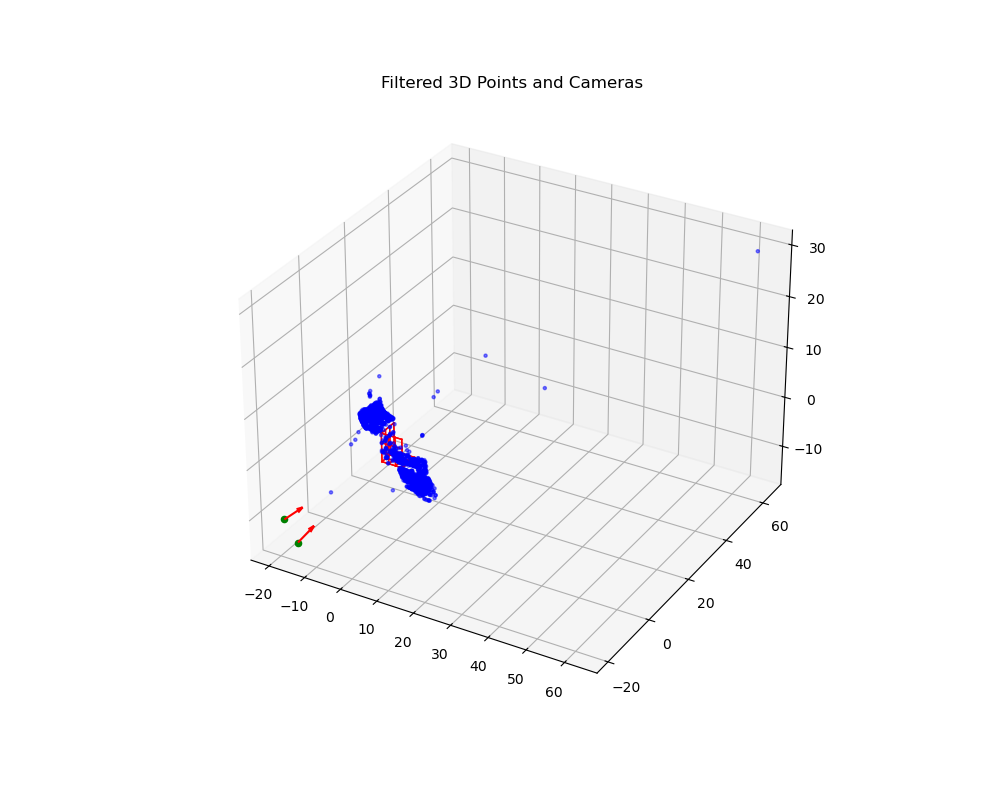

In [ ]:

# ------ Your code here ------

data=scipy.io.loadmat('data/compEx2data.mat')
startind = data['startind'].ravel() - 1 
endind = data['endind'].ravel() - 1


err1 = np.linalg.norm(x1 - x1_proj[:2, :], axis=0)
err2 = np.linalg.norm(x2 - x2_proj[:2, :], axis=0)


mask = (err1 < 3) & (err2 < 3)

X_filtered =X[:, mask]

plt.close('all')
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

for i in range(len(startind)):
    a = startind[i]; b = endind[i]
    p1 = Xmodel[:, a]; p2 = Xmodel[:, b]
    ax.plot([p1[0], p2[0]], [p1[1], p2[1]], [p1[2], p2[2]], 'r-', lw=1)
ax.scatter(X_filtered[0, :], X_filtered[1, :], X_filtered[2, :], c='b', marker='o', s=5, alpha=0.5)
plot_camera(P1_unnorm, 5, ax=ax)
plot_camera(P2_unnorm, 5, ax=ax)
plt.title('Filtered 3D Points and Cameras')
plt.show()



### Your answer here: 

(*Include answers to all questions marked in bold.*)
#
Yes, the cups and the paper can be distinguished in the filtered 3D reconstruction. 